# Imports e Drive

In [1]:
import cv2
import numpy as np
import dlib
import matplotlib.pyplot as plt

from scipy.spatial import distance as dist

from io import BytesIO
from IPython.display import clear_output, Image, display
from PIL import Image as Img
from os import listdir, path, makedirs
from os.path import isfile, join
from sklearn.metrics import accuracy_score

import shutil

In [2]:
from google.colab import drive
drive.mount('/content/drive', force_remount = True)
PATH = '/content/drive/MyDrive/Curso/Alura/computer-vision-classificacao-faces'

Mounted at /content/drive


# Intro Open CV

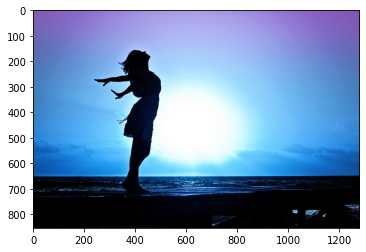

In [3]:
imagem = cv2.imread(f"{PATH}/imagens/px-girl.jpg")
plt.imshow(imagem)


(853, 1280, 3)


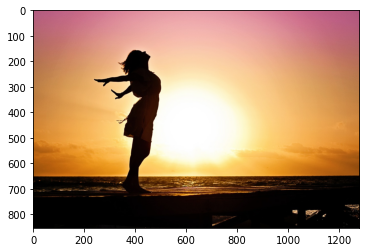

In [4]:
imagem_rgb = cv2.cvtColor(imagem, cv2.COLOR_BGR2RGB)
plt.imshow(imagem_rgb)
print(imagem_rgb.shape)

(853, 1280)


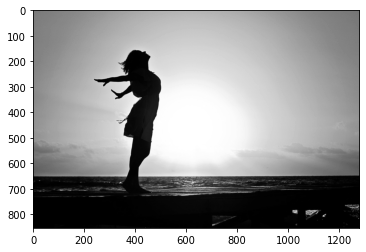

In [5]:
imagem_gray = cv2.cvtColor(imagem_rgb, cv2.COLOR_RGB2GRAY)
plt.imshow(imagem_gray, cmap="gray")
print(imagem_gray.shape)

(853, 1280, 3)


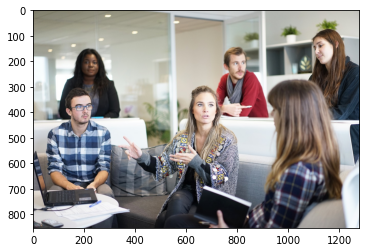

In [6]:
imagem = cv2.imread(f"{PATH}/imagens/px-people.jpg")
imagem = cv2.cvtColor(imagem, cv2.COLOR_BGR2RGB)
plt.imshow(imagem)
print(imagem.shape)

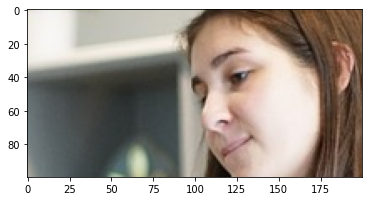

In [7]:
imagem_roi = imagem[100:200, 1000:1200]
plt.imshow(imagem_roi)

In [8]:
imagem_roi_bgr = cv2.cvtColor(imagem_roi, cv2.COLOR_RGB2BGR)
cv2.imwrite("imagem_roi.png", imagem_roi_bgr)

True

# Segmentação de faces

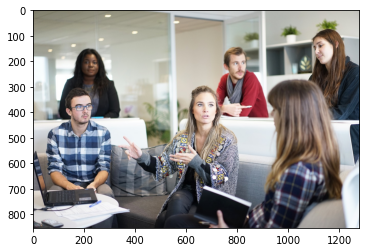

In [9]:
imagem = cv2.imread(f"{PATH}/imagens/px-people.jpg")
imagem = cv2.cvtColor(imagem, cv2.COLOR_BGR2RGB)
plt.imshow(imagem)

In [10]:
imagem_gray = cv2.cvtColor(imagem, cv2.COLOR_RGB2GRAY)

In [11]:
classificador = cv2.CascadeClassifier(f"{PATH}/classificadores/haarcascade_frontalface_default.xml")

In [12]:
faces = classificador.detectMultiScale(imagem_gray, 1.3, 5)

In [13]:
len(faces)

5

In [14]:
faces[0]

array([189, 176,  75,  75], dtype=int32)

In [15]:
imagem_anotada = imagem.copy()

In [16]:
for (x,y,w,h) in faces:
    cv2.rectangle(imagem_anotada, (x,y), (x+w, y+h), (255, 255, 0), 2)

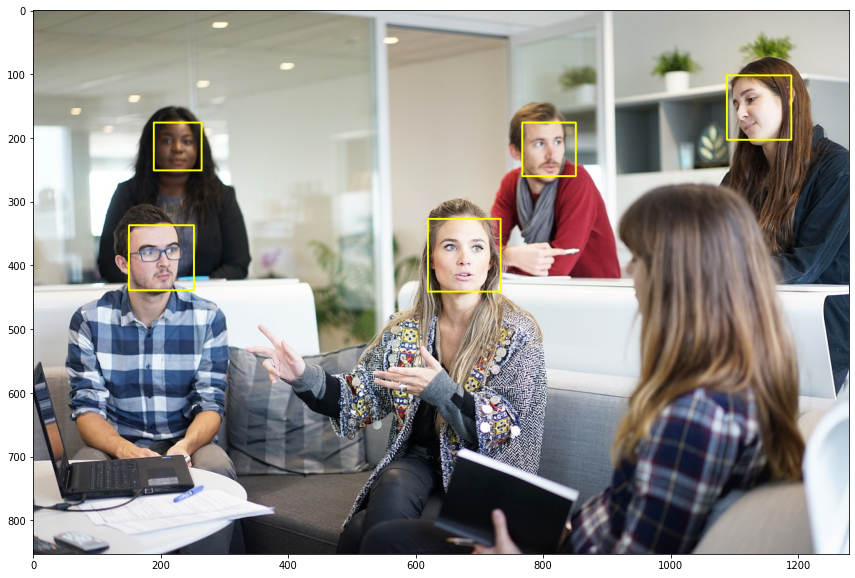

In [17]:
plt.figure(figsize=(20,10))
plt.imshow(imagem_anotada)

In [18]:
face_imagem = 0

for (x,y,w,h) in faces:
    face_imagem += 1
    imagem_roi = imagem[y:y+h, x:x+w]
    imagem_roi = cv2.cvtColor(imagem_roi, cv2.COLOR_RGB2BGR)
    cv2.imwrite("face_" + str(face_imagem) + ".png", imagem_roi)

# Classificação de Faces

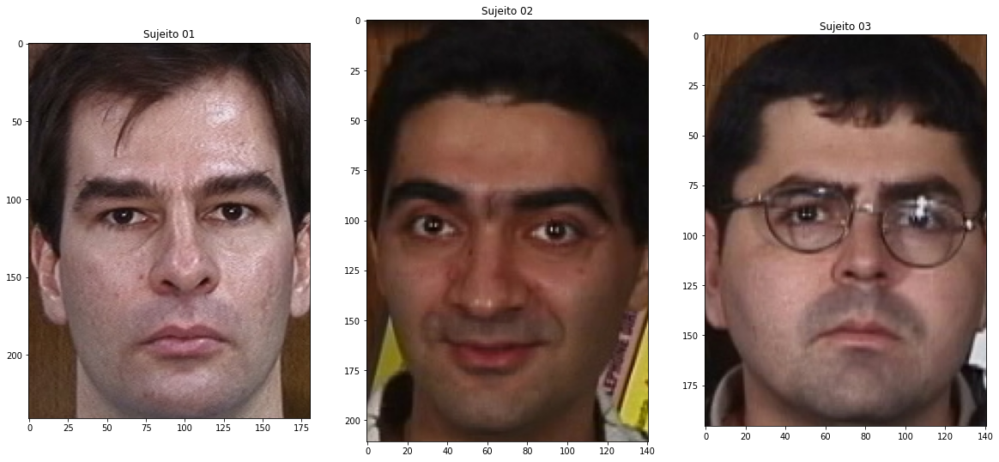

In [19]:
imagem_face_1 = cv2.imread(f"{PATH}/imagens/cropped_faces/s01_01.jpg")
imagem_face_1 = cv2.cvtColor(imagem_face_1, cv2.COLOR_BGR2RGB)

imagem_face_2 = cv2.imread(f"{PATH}/imagens/cropped_faces/s02_01.jpg")
imagem_face_2 = cv2.cvtColor(imagem_face_2, cv2.COLOR_BGR2RGB)

imagem_face_3 = cv2.imread(f"{PATH}/imagens/cropped_faces/s03_01.jpg")
imagem_face_3 = cv2.cvtColor(imagem_face_3, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(20,10))
plt.subplot(131)
plt.title("Sujeito 01")
plt.imshow(imagem_face_1)
plt.subplot(132)
plt.title("Sujeito 02")
plt.imshow(imagem_face_2)
plt.subplot(133)
plt.title("Sujeito 03")
plt.imshow(imagem_face_3)

plt.show()

In [20]:
print(imagem_face_1.shape)
print(imagem_face_2.shape)
print(imagem_face_3.shape)

(241, 181, 3)
(211, 141, 3)
(196, 141, 3)


In [21]:
faces_caminho = f"{PATH}/imagens/cropped_faces/"
lista_arq_faces = [f for f in listdir(faces_caminho) if isfile(join(faces_caminho, f))]

In [22]:
lista_arq_faces[0]

's44_12.jpg'

In [23]:
len(lista_arq_faces)

750

In [24]:
faces_path_treino = f"{PATH}/imagens/treino/"
faces_path_teste = f"{PATH}/imagens/teste/"

if not path.exists(faces_path_treino):
    makedirs(faces_path_treino)

if not path.exists(faces_path_teste):
    makedirs(faces_path_teste)

for arq in lista_arq_faces:
    sujeito = arq[1:3]
    numero = arq[4:6]
    
    if int(numero) <= 10:
        shutil.copyfile(faces_caminho + arq, faces_path_treino + arq)
    else:
        shutil.copyfile(faces_caminho + arq, faces_path_teste + arq)

In [25]:
def padronizar_imagem(imagem_caminho):
    imagem = cv2.imread(imagem_caminho, cv2.IMREAD_GRAYSCALE)
    imagem = cv2.resize(imagem, (200, 200), interpolation=cv2.INTER_LANCZOS4)
    return imagem

In [26]:
lista_faces_treino = [f for f in listdir(faces_path_treino) if isfile(join(faces_path_treino, f))]
lista_faces_teste = [f for f in listdir(faces_path_teste) if isfile(join(faces_path_teste, f))]

In [27]:
lista_faces_treino[0]

's15_03.jpg'

In [28]:
dados_treinamento, sujeitos = [], []

In [29]:
for i, arq in enumerate(lista_faces_treino):
    imagem_path = faces_path_treino + arq
    imagem = padronizar_imagem(imagem_path)
    dados_treinamento.append(imagem)
    sujeito = arq[1:3]
    sujeitos.append(int(sujeito))

In [30]:
len(dados_treinamento)

500

In [31]:
len(sujeitos)

500

In [32]:
dados_teste, sujeitos_teste = [], [] 

In [33]:
for i, arq in enumerate(lista_faces_teste):
    imagem_path = faces_path_teste + arq
    imagem = padronizar_imagem(imagem_path)
    dados_teste.append(imagem)
    sujeito = arq[1:3]
    sujeitos_teste.append(int(sujeito))

In [34]:
len(dados_teste)

250

In [35]:
len(sujeitos_teste)

250

Text(0.5, 1.0, '2')

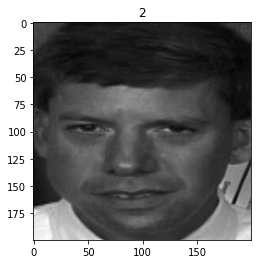

In [36]:
plt.imshow(dados_treinamento[0], cmap="gray")
plt.title(sujeito[0])

Text(0.5, 1.0, '44')

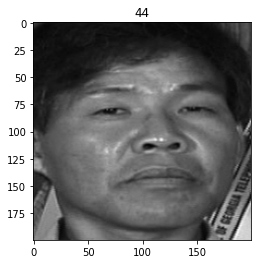

In [37]:
plt.imshow(dados_teste[0], cmap="gray")
plt.title(sujeitos_teste[0])

In [38]:
sujeitos = np.asarray(sujeitos, dtype=np.int32)
sujeitos_teste = np.asarray(sujeitos_teste, dtype=np.int32)

In [39]:
modelo_eingenfaces = cv2.face.EigenFaceRecognizer_create()

In [40]:
modelo_eingenfaces.train(dados_treinamento, sujeitos)

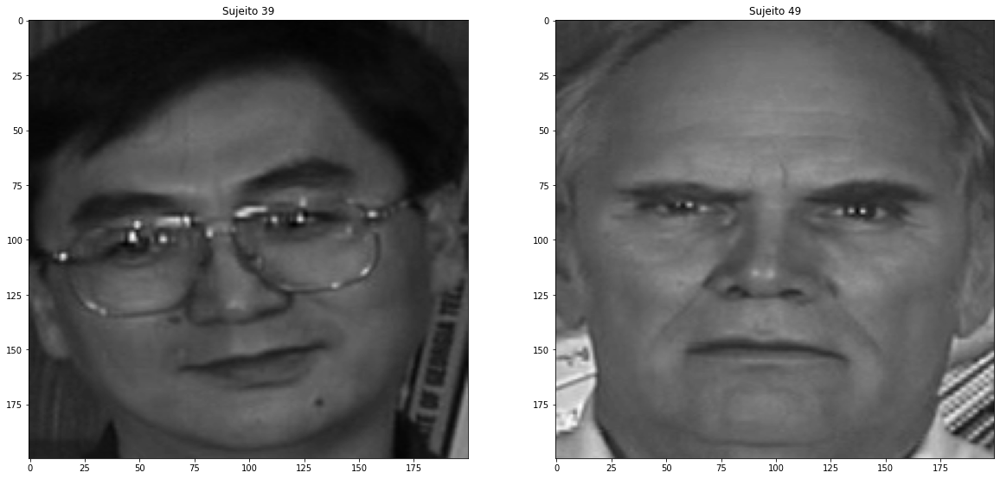

In [41]:
plt.figure(figsize=(20,10))

plt.subplot(121)
plt.title("Sujeito " + str(sujeitos_teste[6]))
plt.imshow(dados_teste[6], cmap="gray")

plt.subplot(122)
plt.title("Sujeito " + str(sujeitos_teste[7]))
plt.imshow(dados_teste[7], cmap="gray")

plt.show()

In [42]:
predicao = modelo_eingenfaces.predict(dados_teste[6])
predicao

(32, 4227.679060620412)

In [43]:
predicao = modelo_eingenfaces.predict(dados_teste[7])
predicao

(49, 3985.1156605109236)

In [44]:
modelo_fisherfaces = cv2.face.FisherFaceRecognizer_create()

In [45]:
modelo_fisherfaces.train(dados_treinamento, sujeitos)

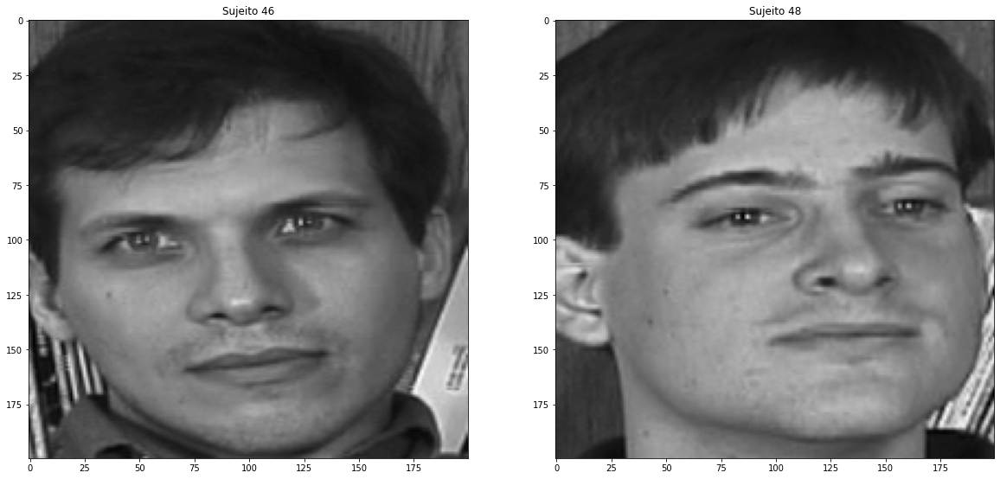

In [46]:
plt.figure(figsize=(20,10))

plt.subplot(121)
plt.title("Sujeito " + str(sujeitos_teste[13]))
plt.imshow(dados_teste[13], cmap="gray")

plt.subplot(122)
plt.title("Sujeito " + str(sujeitos_teste[19]))
plt.imshow(dados_teste[19], cmap="gray")

plt.show()

In [47]:
predicao = modelo_fisherfaces.predict(dados_teste[13])
predicao

(25, 1144.0402733083392)

In [48]:
predicao = modelo_fisherfaces.predict(dados_teste[19])
predicao

(48, 1114.4677652508472)

In [49]:
modelo_lbph = cv2.face.LBPHFaceRecognizer_create()

In [50]:
modelo_lbph.train(dados_treinamento, sujeitos)

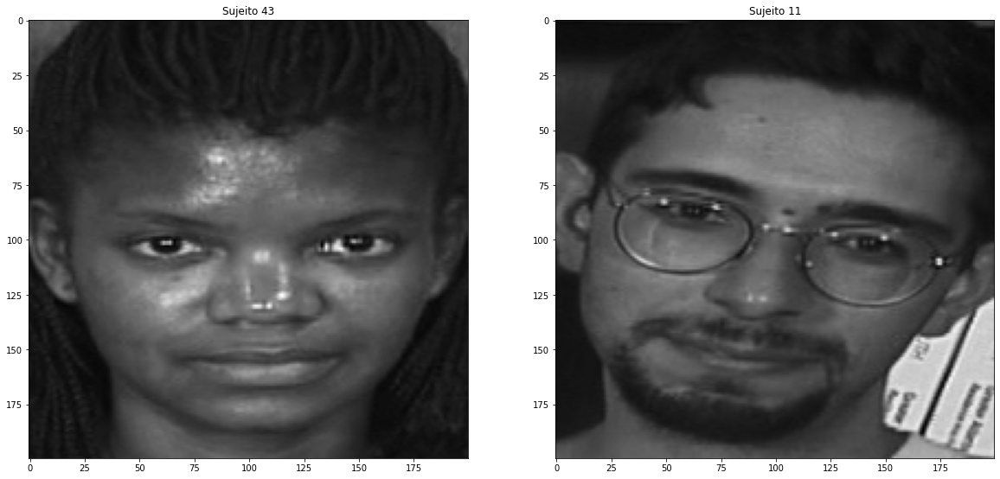

In [51]:
plt.figure(figsize=(20,10))

plt.subplot(121)
plt.title("Sujeito " + str(sujeitos_teste[21]))
plt.imshow(dados_teste[21], cmap="gray")

plt.subplot(122)
plt.title("Sujeito " + str(sujeitos_teste[27]))
plt.imshow(dados_teste[27], cmap="gray")

plt.show()

In [52]:
predicao = modelo_lbph.predict(dados_teste[21])
predicao

(43, 28.812539930824595)

In [53]:
predicao = modelo_lbph.predict(dados_teste[27])
predicao

(2, 45.516665950322995)

In [54]:
y_pred_eingenfaces = []

In [55]:
for item in dados_teste:
    y_pred_eingenfaces.append(modelo_eingenfaces.predict(item)[0])

In [56]:
acuracia_eingenfaces = accuracy_score(sujeitos_teste, y_pred_eingenfaces)

In [57]:
acuracia_eingenfaces

0.724

In [58]:
y_pred_fisherfaces = []

In [59]:
for item in dados_teste:
    y_pred_fisherfaces.append(modelo_fisherfaces.predict(item)[0])

In [60]:
acuracia_fisherfaces = accuracy_score(sujeitos_teste, y_pred_fisherfaces)

In [61]:
acuracia_fisherfaces

0.52

In [62]:
y_pred_lbph = []

In [63]:
for item in dados_teste:
    y_pred_lbph.append(modelo_lbph.predict(item)[0])

In [64]:
acuracia_lbph = accuracy_score(sujeitos_teste, y_pred_lbph)

In [65]:
acuracia_lbph

0.792

# Aplicações de Análise Facial

In [66]:
imagem = cv2.imread(f"{PATH}/imagens/px-woman-smilings.jpg")
imagem = cv2.cvtColor(imagem, cv2.COLOR_BGR2RGB)

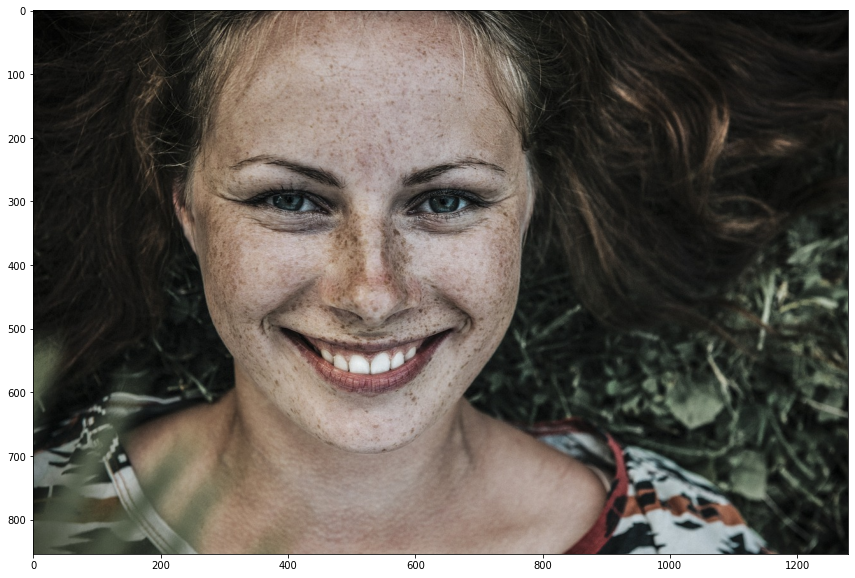

In [67]:
plt.figure(figsize=(20,10))
plt.imshow(imagem)

In [68]:
classificador_dlib_68_path = f"{PATH}/classificadores/shape_predictor_68_face_landmarks.dat"
classificador_dlib = dlib.shape_predictor(classificador_dlib_68_path)
detector_face = dlib.get_frontal_face_detector()

In [69]:
def anotar_rosto(imagem):
    retangulos = detector_face(imagem, 1)
    
    if len(retangulos) == 0:
        return None
    
    for k, d in enumerate(retangulos):
        print("Identificado rosto " + str(k))
        cv2.rectangle(imagem, (d.left(), d.top()), (d.right(), d.bottom()), (255, 255, 0), 2)
    
    return imagem

In [70]:
imagem_anotada = imagem.copy()
imagem_anotada = anotar_rosto(imagem_anotada)

Identificado rosto 0


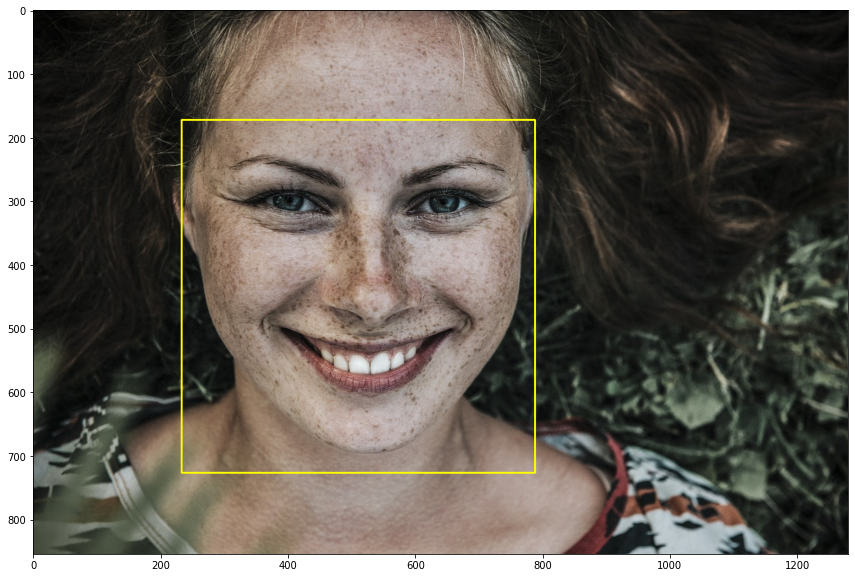

In [71]:
plt.figure(figsize=(20,10))
plt.imshow(imagem_anotada)

In [72]:
def pontos_marcos_faciais(imagem):
    retangulos = detector_face(imagem, 1)
    
    if len(retangulos) == 0:
        return None
    
    marcos = []
    
    for ret in retangulos:
        marcos.append(np.matrix([[p.x, p.y] for p in classificador_dlib(imagem,ret).parts()]))
    
    return marcos

In [73]:
marcos_faciais = pontos_marcos_faciais(imagem)

In [74]:
len(marcos_faciais)

1

In [75]:
len(marcos_faciais[0])

68

In [76]:
def anotar_marcos_faciais(imagem, marcos):
    
    for marco in marcos:
        for idx, ponto in enumerate(marco):
            centro = (ponto[0,0], ponto[0,1])
            cv2.circle(imagem, centro, 3, (255,255,0), -1)
            #cv2.putText(imagem, str(idx), centro, cv2.FONT_HERSHEY_SIMPLEX, 0.8,
            #           (255,255,255), 2)
    
    return imagem

In [77]:
imagem_anotada = imagem.copy()
imagem_anotada = anotar_marcos_faciais(imagem_anotada, marcos_faciais)

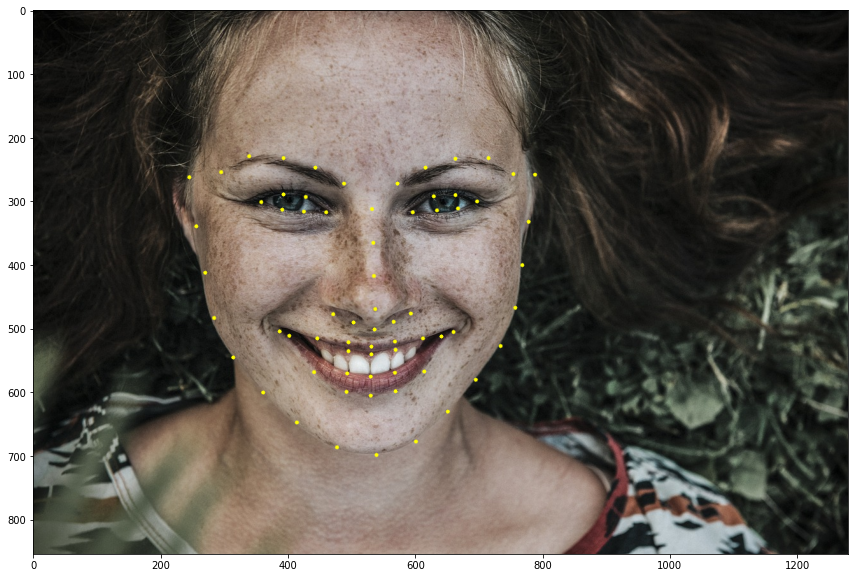

In [78]:
plt.figure(figsize=(20,10))
plt.imshow(imagem_anotada)

In [79]:
imagem_pessoa = cv2.imread(f"{PATH}/imagens/px-man-happy.jpg")
imagem_pessoa = cv2.cvtColor(imagem_pessoa, cv2.COLOR_BGR2RGB)

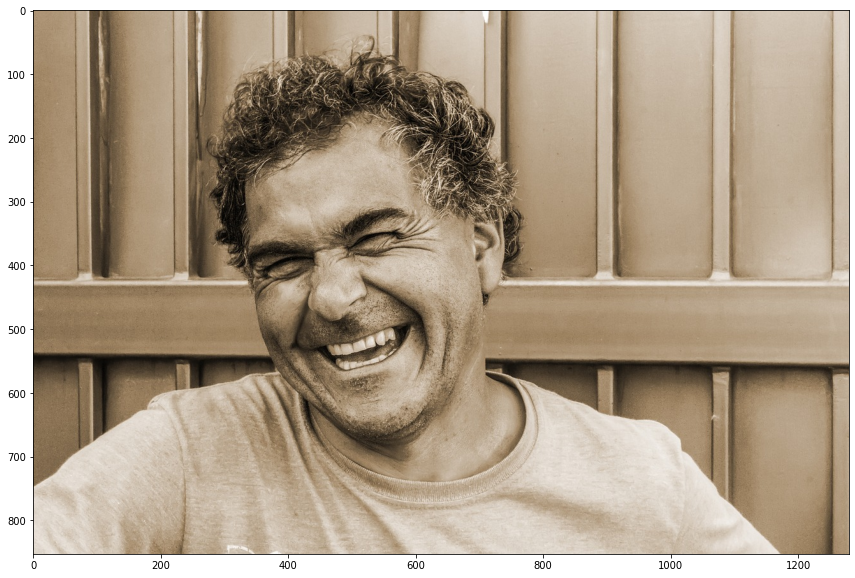

In [80]:
plt.figure(figsize=(20,10))
plt.imshow(imagem_pessoa)

In [81]:
imagem_anotada = imagem_pessoa.copy()
marcos_faciais = pontos_marcos_faciais(imagem_anotada)
imagem_anotada = anotar_marcos_faciais(imagem_anotada, marcos_faciais)

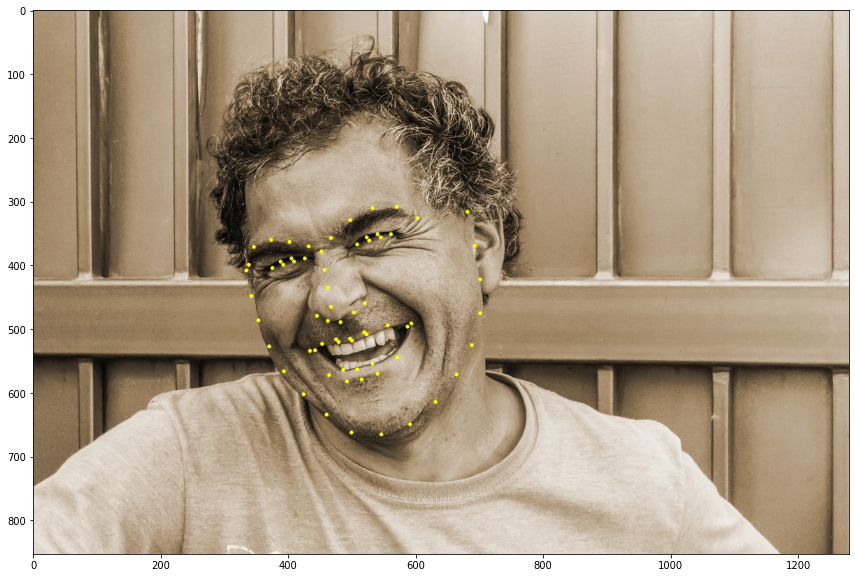

In [82]:
plt.figure(figsize=(20,10))
plt.imshow(imagem_anotada)

In [83]:
FACE = list(range(17, 68))
FACE_COMPLETA = list(range(0, 68))
LABIO = list(range(48, 61))
SOMBRANCELHA_DIRETA = list(range(17, 22))
SOMBRANCELHA_ESQUERDA = list(range(22, 27))
OLHO_DIREITO = list(range(36,42))
OLHO_ESQUERDO = list(range(42,48))
NARIZ = list(range(27,35))
MANDIBULA = list(range(0,17))

In [84]:
def aspecto_razao_olhos(pontos_olhos):
    
    a = dist.euclidean(pontos_olhos[1], pontos_olhos[5])
    b = dist.euclidean(pontos_olhos[2], pontos_olhos[4])
    c = dist.euclidean(pontos_olhos[0], pontos_olhos[3])
    
    aspecto_razao = (a + b)/(2.0 * c)
    
    return aspecto_razao

In [85]:
def anotar_marcos_casca_convexa(imagem, marcos):
    retangulos = detector_face(imagem, 1)
    
    if len(retangulos) == 0:
        return None
    
    for idx, ret in enumerate(retangulos):
        marco = marcos[idx]
        
        pontos = cv2.convexHull(marco[OLHO_ESQUERDO])
        cv2.drawContours(imagem, [pontos], 0, (0,255,0), 2)
        
        pontos = cv2.convexHull(marco[OLHO_DIREITO])
        cv2.drawContours(imagem, [pontos], 0, (0,255,0), 2)
    
    return imagem

In [86]:
def anotar_marcos_casca_convexa_boca(imagem, marcos):
    retangulos = detector_face(imagem, 1)
    
    if len(retangulos) == 0:
        return None
    
    for idx, ret in enumerate(retangulos):
        marco = marcos[idx]
        
        pontos = cv2.convexHull(marco[LABIO])
        cv2.drawContours(imagem, [pontos], 0, (0,255,0), 2)

    return imagem

In [87]:
imagem_anotada = imagem_pessoa.copy()
imagem_anotada = anotar_marcos_casca_convexa(imagem_anotada, marcos_faciais)

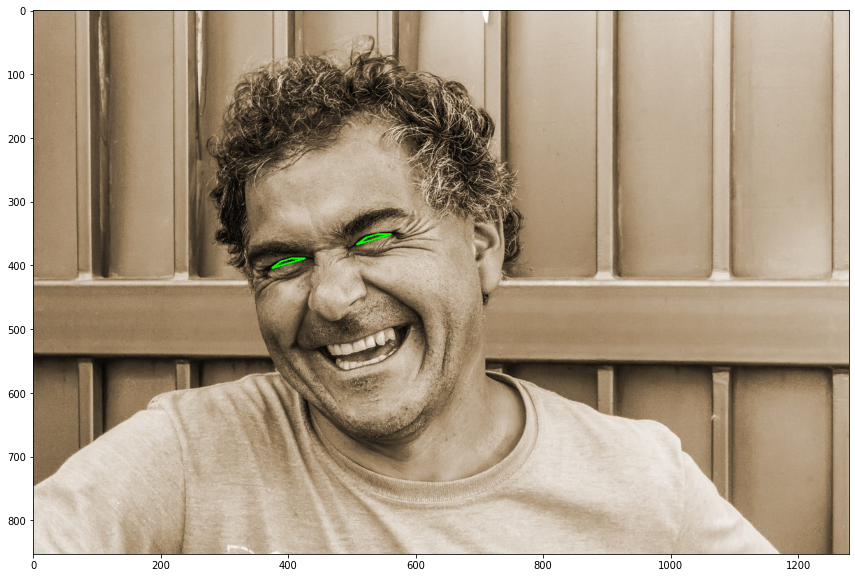

In [88]:
plt.figure(figsize=(20,10))
plt.imshow(imagem_anotada)

In [89]:
valor_olho_esquerdo = aspecto_razao_olhos(marcos_faciais[0][OLHO_ESQUERDO])
valor_olho_esquerdo

0.12169073046467273

In [90]:
valor_olho_direito = aspecto_razao_olhos(marcos_faciais[0][OLHO_DIREITO])
valor_olho_direito

0.12044973520917499

In [91]:
imagem_pessoa_seria = cv2.imread(f"{PATH}/imagens/px-man-serious.jpg")
imagem_pessoa_seria = cv2.cvtColor(imagem_pessoa_seria, cv2.COLOR_BGR2RGB)

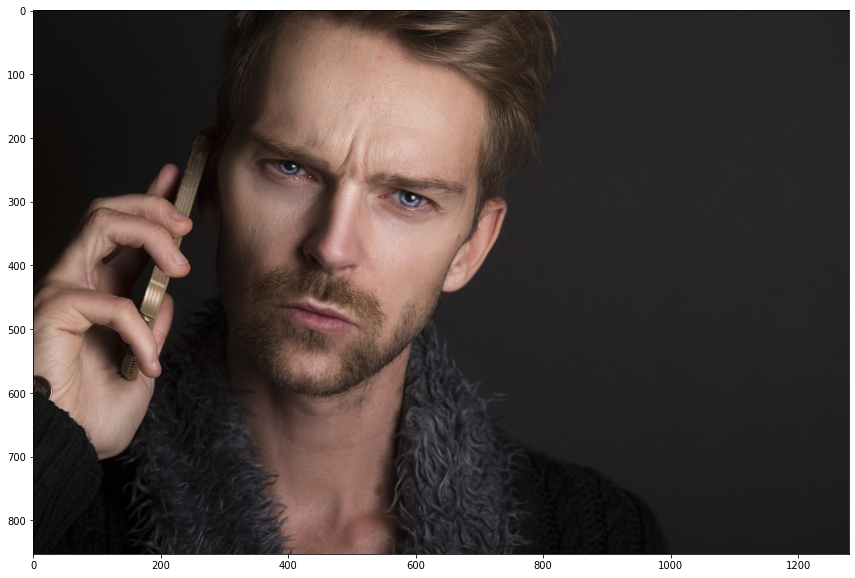

In [92]:
plt.figure(figsize=(20,10))
plt.imshow(imagem_pessoa_seria)

In [93]:
marcos_faciais = pontos_marcos_faciais(imagem_pessoa_seria)

In [94]:
imagem_anotada = imagem_pessoa_seria.copy()
imagem_anotada = anotar_marcos_casca_convexa(imagem_anotada, marcos_faciais)

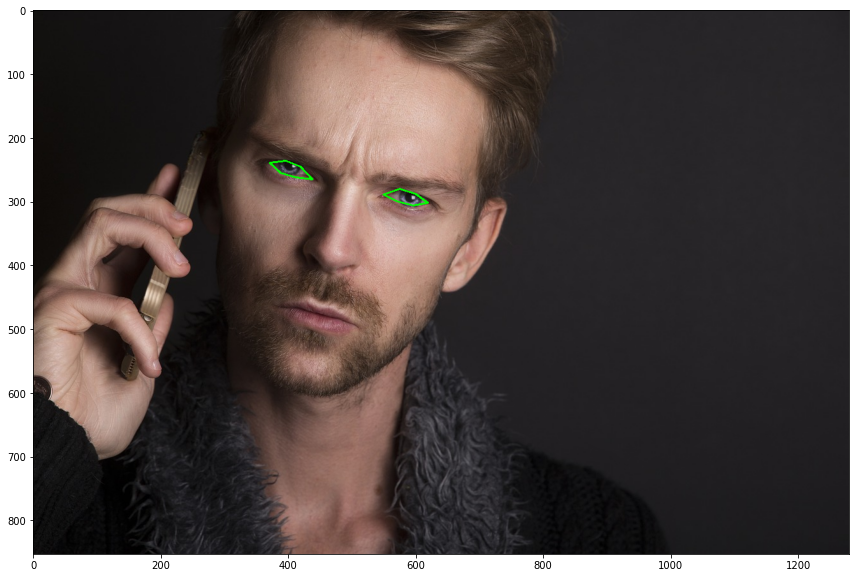

In [95]:
plt.figure(figsize=(20,10))
plt.imshow(imagem_anotada)

In [96]:
valor_olho_esquerdo = aspecto_razao_olhos(marcos_faciais[0][OLHO_ESQUERDO])
valor_olho_esquerdo

0.2715204726310253

In [97]:
valor_olho_direito = aspecto_razao_olhos(marcos_faciais[0][OLHO_DIREITO])
valor_olho_direito

0.27133313866169434

In [98]:
def padronizar_imagem(frame):
    frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
    frame = cv2.resize(frame, (500, 400))
    return frame

In [99]:
def exibir_video(frame):
    img = Img.fromarray(frame, "RGB")
    buffer = BytesIO()
    img.save(buffer, format="JPEG")
    display(Image(data=buffer.getvalue()))
    clear_output(wait=True)

In [100]:
video = cv2.VideoCapture(f"{PATH}/videos/expressoes.mov")

try:
    while(True):
        captura_ok, frame = video.read()
        if captura_ok:
            frame = padronizar_imagem(frame)
            exibir_video(frame)
except KeyboardInterrupt:
    video.release()
    print("Interrompido")

Interrompido


In [101]:
def aspecto_razao_boca(pontos_boca):
    a = dist.euclidean(pontos_boca[3], pontos_boca[9])
    b = dist.euclidean(pontos_boca[2], pontos_boca[10])
    c = dist.euclidean(pontos_boca[4], pontos_boca[8])
    d = dist.euclidean(pontos_boca[0], pontos_boca[6])
    
    aspecto_razao = (a + b + c)/(3.0*d)
    
    return aspecto_razao

In [102]:
try:
    ar_max = 0
    video = cv2.VideoCapture(f"{PATH}/videos/bocejo.mov")
    while(True):
        captura_ok, frame = video.read()
        if captura_ok:
            frame = padronizar_imagem(frame)
            marcos_faciais = pontos_marcos_faciais(frame)
            
            if marcos_faciais is not None:
                ar_boca = aspecto_razao_boca(marcos_faciais[0][LABIO])
                ar_boca = round(ar_boca, 3)
                
                if ar_boca > ar_max:
                    ar_max = ar_boca
                
                info = "boca " + str(ar_boca) + " maximo " + str(ar_max)
                
                frame = anotar_marcos_casca_convexa_boca(frame, marcos_faciais)
                cv2.putText(frame, info, (20, 50), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255,255,0), 2)
            
            exibir_video(frame)
            
except KeyboardInterrupt:
    video.release()
    print("Interrompido")

Interrompido


In [103]:
try:
    min_olho_esq = 1
    min_olho_dir = 1
    
    video = cv2.VideoCapture(f"{PATH}/videos/olhos-fechados.mov")
    
    while(True):
        captura_ok, frame = video.read()
        frame = padronizar_imagem(frame)
        
        marcos_faciais = pontos_marcos_faciais(frame)
        
        if marcos_faciais is not None:
            ar_olho_esq = aspecto_razao_olhos(marcos_faciais[0][OLHO_ESQUERDO])
            ar_olho_dir = aspecto_razao_olhos(marcos_faciais[0][OLHO_DIREITO])
            
            ar_olho_esq = round(ar_olho_esq, 3)
            ar_olho_dir = round(ar_olho_dir, 3)
            
            if ar_olho_esq < min_olho_esq:
                min_olho_esq = ar_olho_esq
                
            if ar_olho_dir < min_olho_dir:
                min_olho_dir = ar_olho_dir
            
            info_oe = "olho esquerdo " + str(ar_olho_esq) + " minimo " + str(min_olho_esq)
            info_od = "olho direito " + str(ar_olho_dir) + " minimo " + str(min_olho_dir)
            
            frame = anotar_marcos_casca_convexa(frame, marcos_faciais)
            
            cv2.putText(frame, info_oe, (20, 50), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255,255,0), 2)
            cv2.putText(frame, info_od, (20, 80), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255,255,0), 2)
            
        exibir_video(frame)
        
except KeyboardInterrupt:
    video.release()
    print("Interrompido")

Interrompido
